# Linear Regression and Time Series Evaluation

### Done By Galen Raphael Pereira

### Using data analytics to predict energy usage for this house and Performing Time Series evaluaton on the dataset



## Linear Regression

###  Read the dataset

In [1]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.dates as mdates

import seaborn as sns
import statsmodels
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
#importing metrics
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from math import sqrt

#importing min max scalar to scale data for the prediction model
from sklearn.preprocessing import MinMaxScaler

# hide warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
housing = pd.read_csv('energydata_complete-1.csv')
housing.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [3]:
housing.shape

(19735, 29)

In [4]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

### 2. Analyse and visualise the data

In [6]:
import pandas_profiling
#profile_report = pandas_profiling.ProfileReport(housing)
#profile_report
numeric_data = housing.select_dtypes(include = ['float64','int64'])
numeric_data.head(50)

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,...,17.033333,45.530000,6.600000,733.500000,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,...,17.066667,45.560000,6.483333,733.600000,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,...,17.000000,45.500000,6.366667,733.700000,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,...,17.000000,45.400000,6.250000,733.800000,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,...,17.000000,45.400000,6.133333,733.900000,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
5,50,40,19.890000,46.026667,19.200000,44.500000,19.790000,44.933333,18.890000,45.730000,...,17.000000,45.290000,6.016667,734.000000,92.000000,5.333333,43.833333,4.800000,44.919484,44.919484
6,60,50,19.890000,45.766667,19.200000,44.500000,19.790000,44.900000,18.890000,45.790000,...,17.000000,45.290000,5.900000,734.100000,92.000000,5.000000,40.000000,4.700000,47.233763,47.233763
7,60,50,19.856667,45.560000,19.200000,44.500000,19.730000,44.900000,18.890000,45.863333,...,17.000000,45.290000,5.916667,734.166667,91.833333,5.166667,40.000000,4.683333,33.039890,33.039890
8,60,40,19.790000,45.597500,19.200000,44.433333,19.730000,44.790000,18.890000,45.790000,...,17.000000,45.290000,5.933333,734.233333,91.666667,5.333333,40.000000,4.666667,31.455702,31.455702
9,70,40,19.856667,46.090000,19.230000,44.400000,19.790000,44.863333,18.890000,46.096667,...,17.000000,45.290000,5.950000,734.300000,91.500000,5.500000,40.000000,4.650000,3.089314,3.089314


In [7]:
#checking percentage of null values in each column
df_missing=pd.DataFrame((round(100*(housing.isnull().sum()/len(housing.index)), 2)), columns=['missing'])
df_missing.sort_values(by=['missing'], ascending=False).head(20)

,missing
date,0.0
T7,0.0
rv1,0.0
Tdewpoint,0.0
Visibility,0.0
Windspeed,0.0
RH_out,0.0
Press_mm_hg,0.0
T_out,0.0
RH_9,0.0


In [8]:
import datetime as dt
import pytz
# convert date column to datetime format
housing['date'] = pd.to_datetime(housing['date'], format='%Y-%m-%d %H:%M:%S')
print(housing['date'])
# convert to UTC timezone
local = pytz.timezone("Asia/Tehran")
housing['date'] = housing['date'].apply(lambda x : local.localize(x, is_dst=False))
housing['date'] = housing['date'].apply(lambda x : x.astimezone(pytz.utc))

# check date column class
print(type(housing['date'][0]))


#define functions
def second_day(x):
    # x is an object in datetime format
    s = x.hour*3600 + x.minute*60 + x.second
    return s

def weekend_weekday(x):
    val = x.strftime("%A")
    if val == "Saturday" or val == "Sunday":
        val2 = "Weekend"
    else:
        val2= "Weekday"
    return val2

# apply functions to create new columns
housing['NSM'] = housing['date'].apply(second_day)
housing['WeekStatus'] = housing['date'].apply(weekend_weekday)
housing['Day_of_week'] = housing['date'].apply(lambda x : x.strftime('%A'))

# print unique values of new columns
print(housing['WeekStatus'].unique())
print(housing['Day_of_week'].unique())

# convert columns to categorical type
housing['Day_of_week'] = housing['Day_of_week'].astype('category')
housing['WeekStatus'] = housing['WeekStatus'].astype('category')

# print data structure
print(housing.info())
print(housing.shape)
print(housing.columns)

0       2016-01-11 17:00:00
1       2016-01-11 17:10:00
2       2016-01-11 17:20:00
3       2016-01-11 17:30:00
4       2016-01-11 17:40:00
                ...        
19730   2016-05-27 17:20:00
19731   2016-05-27 17:30:00
19732   2016-05-27 17:40:00
19733   2016-05-27 17:50:00
19734   2016-05-27 18:00:00
Name: date, Length: 19735, dtype: datetime64[ns]
<class 'pandas._libs.tslibs.timestamps.Timestamp'>
['Weekday' 'Weekend']
['Monday' 'Tuesday' 'Wednesday' 'Thursday' 'Friday' 'Saturday' 'Sunday']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 32 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   date         19735 non-null  datetime64[ns, UTC]
 1   Appliances   19735 non-null  int64              
 2   lights       19735 non-null  int64              
 3   T1           19735 non-null  float64            
 4   RH_1         19735 non-null  float64            
 5   T2   

### EDA

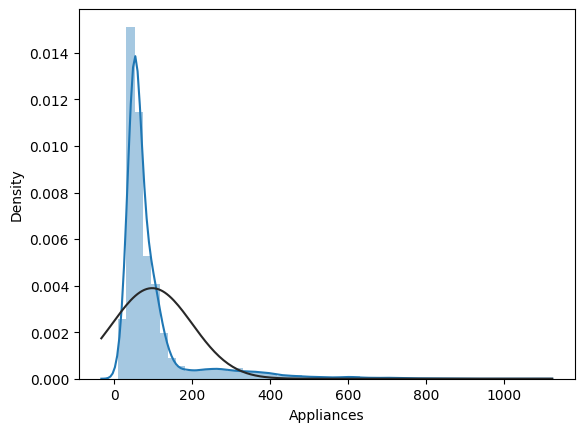

In [9]:
# Let us first visualize the spread of Target Variable 'Sale Price'
from scipy.stats import norm
sns.distplot(housing['Appliances'], fit=norm)
plt.show()

In [10]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 32 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   date         19735 non-null  datetime64[ns, UTC]
 1   Appliances   19735 non-null  int64              
 2   lights       19735 non-null  int64              
 3   T1           19735 non-null  float64            
 4   RH_1         19735 non-null  float64            
 5   T2           19735 non-null  float64            
 6   RH_2         19735 non-null  float64            
 7   T3           19735 non-null  float64            
 8   RH_3         19735 non-null  float64            
 9   T4           19735 non-null  float64            
 10  RH_4         19735 non-null  float64            
 11  T5           19735 non-null  float64            
 12  RH_5         19735 non-null  float64            
 13  T6           19735 non-null  float64            
 14  RH_6         19735 non

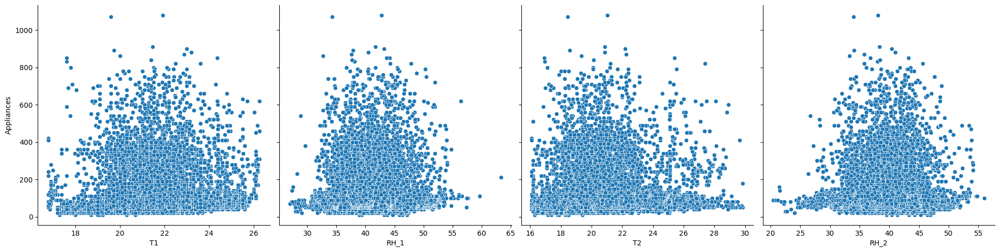

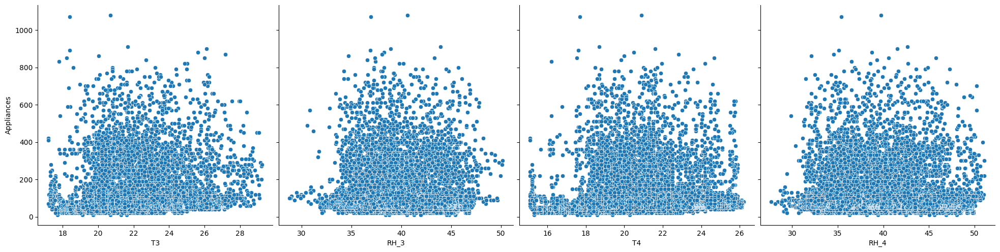

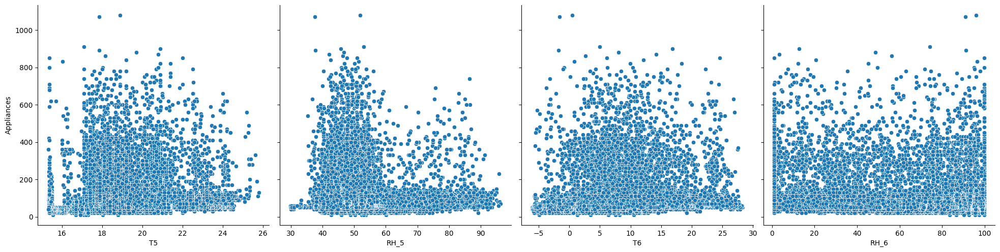

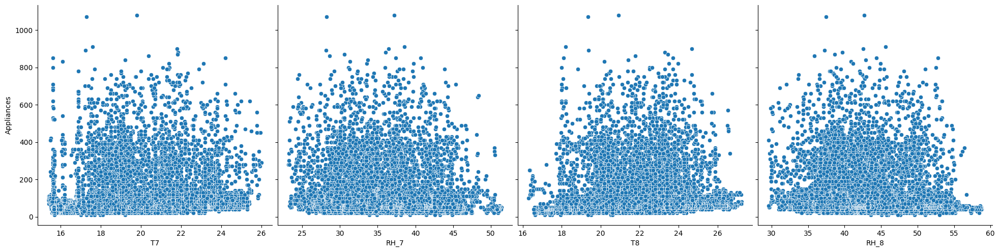

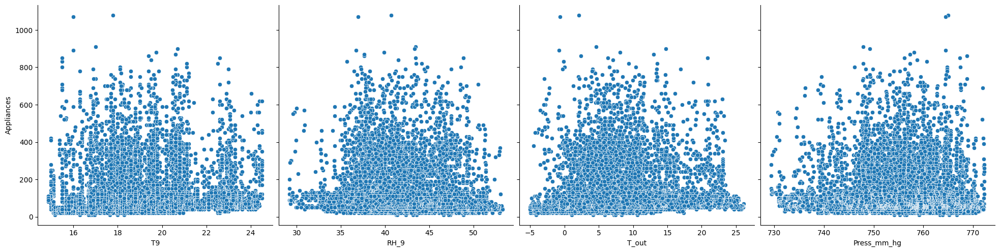

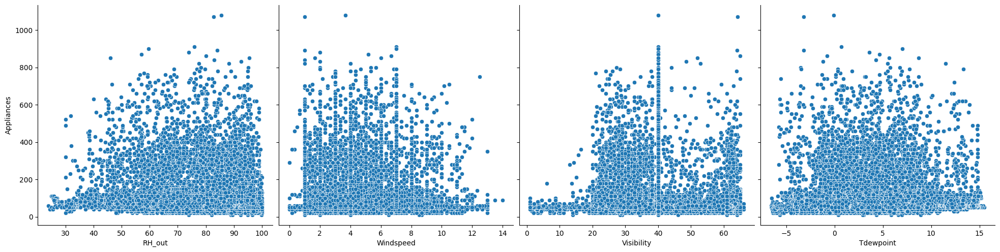

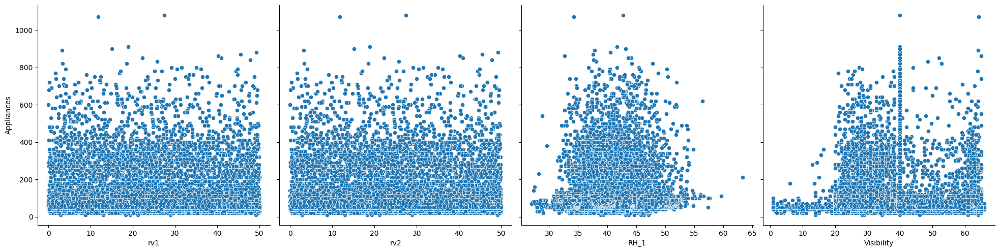

In [11]:
#function to plot scatter plot numeric variables with price
def pp(w,x,y,z):
    sns.pairplot(housing, x_vars=[w,x,y,z], y_vars='Appliances',height=5, aspect=1, kind='scatter')
    plt.show()

pp('T1', 'RH_1', 'T2','RH_2',)
pp('T3', 'RH_3', 'T4', 'RH_4')
pp('T5','RH_5','T6','RH_6')
pp('T7', 'RH_7', 'T8', 'RH_8')
pp('T9','RH_9','T_out','Press_mm_hg')
pp('RH_out','Windspeed','Visibility','Tdewpoint')
pp('rv1','rv2','RH_1','Visibility')


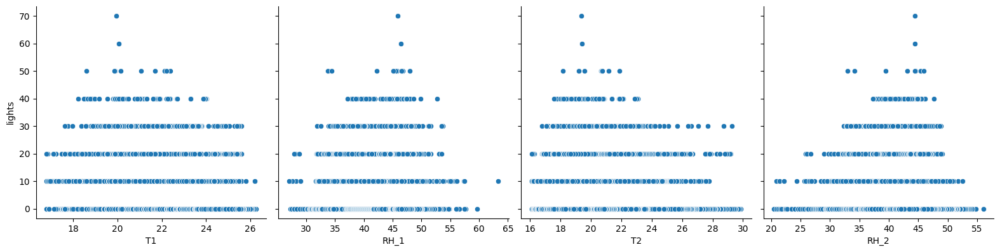

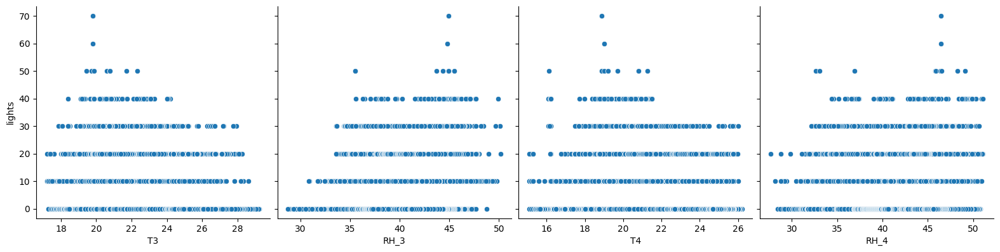

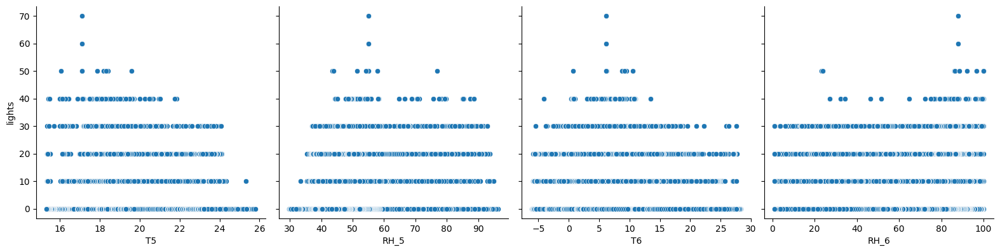

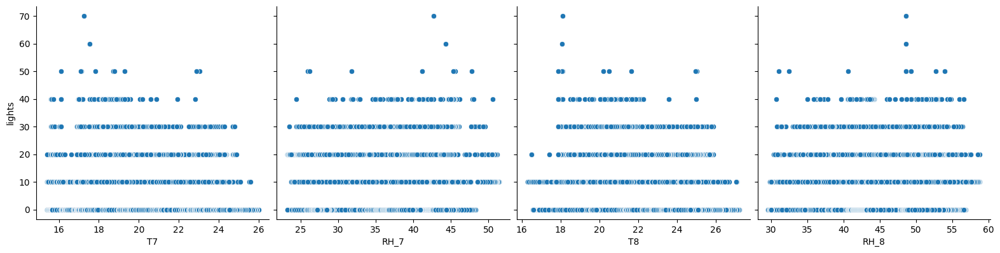

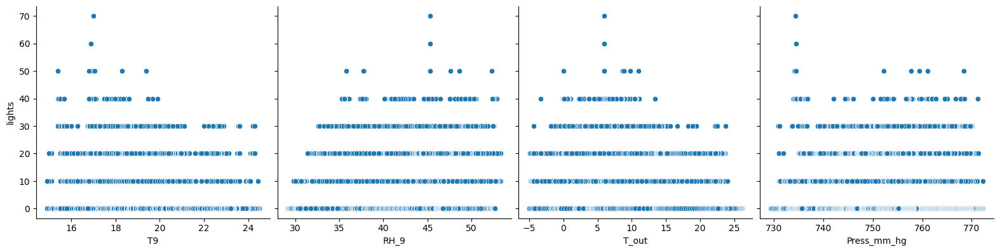

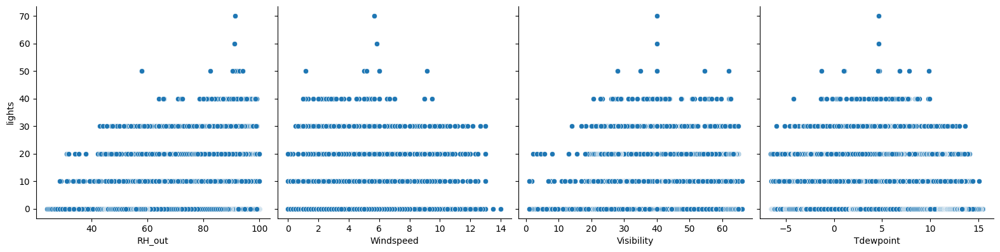

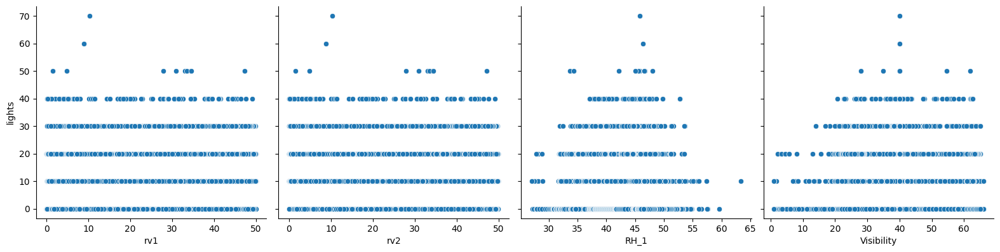

In [12]:
#function to plot scatter plot numeric variables with Lights
def pp(w,x,y,z):
    sns.pairplot(housing, x_vars=[w,x,y,z], y_vars='lights',height=4, aspect=1, kind='scatter')
    plt.show()

pp('T1', 'RH_1', 'T2','RH_2',)
pp('T3', 'RH_3', 'T4', 'RH_4')
pp('T5','RH_5','T6','RH_6')
pp('T7', 'RH_7', 'T8', 'RH_8')
pp('T9','RH_9','T_out','Press_mm_hg')
pp('RH_out','Windspeed','Visibility','Tdewpoint')
pp('rv1','rv2','RH_1','Visibility')


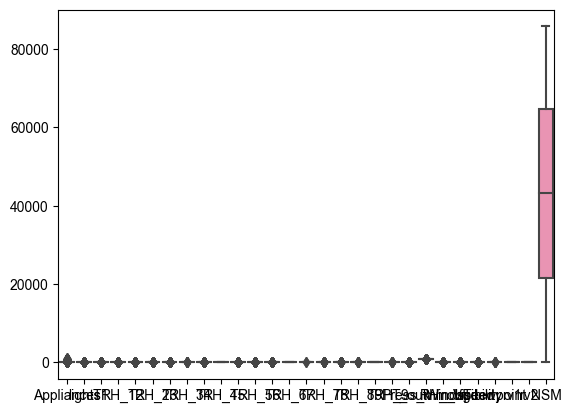

In [13]:
## FUNCTION TO PLOT Box plot
sns.boxplot(data=housing)
sns.set(rc={"figure.figsize":(50, 20)})

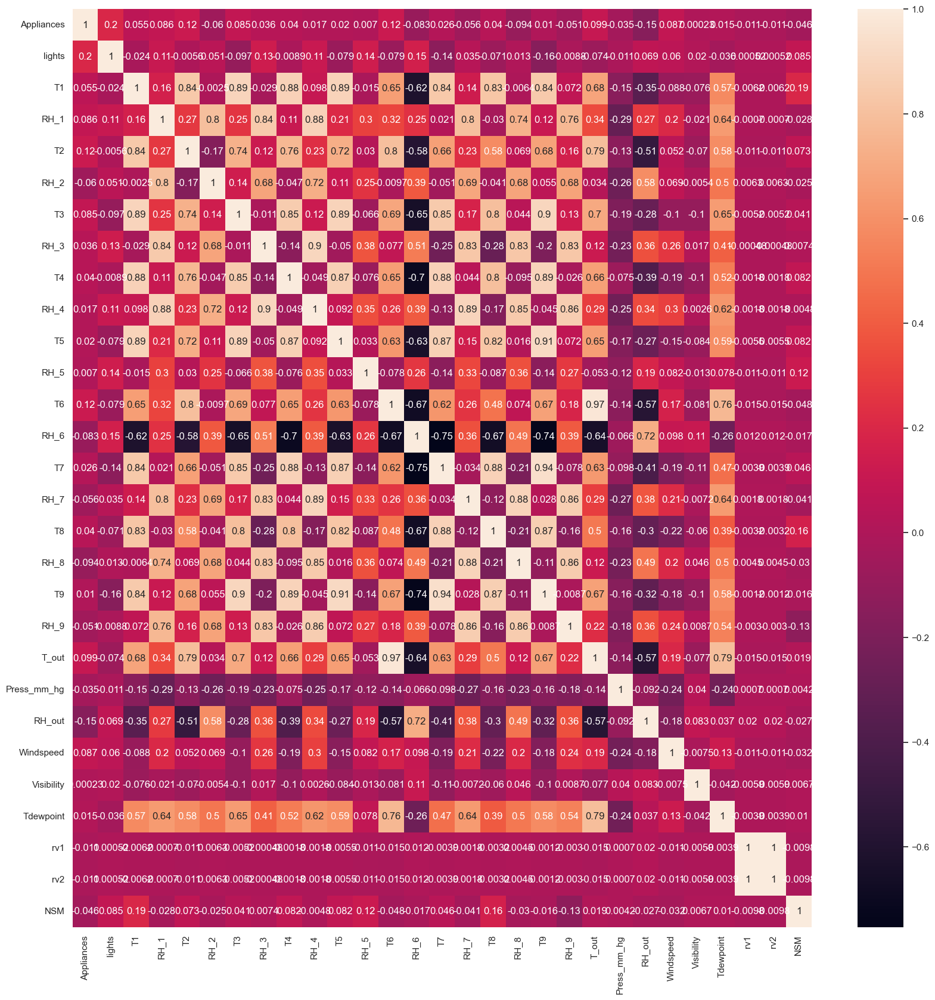

In [14]:
#Correlation matrix
#function call
cor= housing.corr()
plt.figure(figsize=(20,20))
sns.heatmap(cor,xticklabels=cor.columns,yticklabels=cor.columns,annot=True)
plt.show()

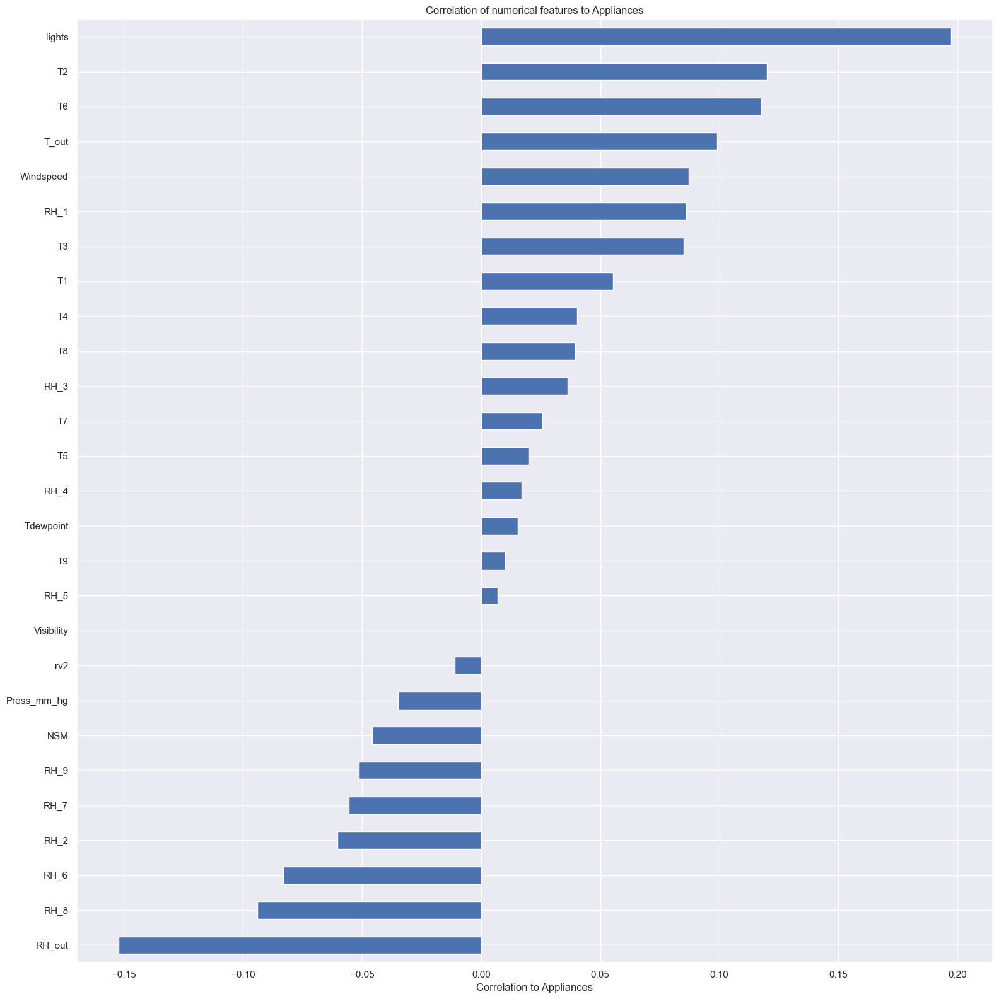

In [15]:
# we drop Id (not relevant)
corr = housing.drop(["rv1"], axis=1).select_dtypes(include="number").corr()
plt.figure(figsize=(16,16));
corr["Appliances"].sort_values(ascending=True)[:-1].plot(kind="barh")
plt.title("Correlation of numerical features to Appliances")
plt.xlabel("Correlation to Appliances")
plt.tight_layout()
plt.show()

In [16]:
housing_categorical = housing.select_dtypes(include=['category'])
print(housing_categorical.head())
# convert into dummies
housing_dummies = pd.get_dummies(housing_categorical, drop_first=True)
print(housing_dummies.head())
#dropping original categorical columns
df = housing.drop(list(housing_categorical.columns), axis=1)
#concatenating dummy columns to original dataframe
housing = pd.concat([df,housing_dummies], axis=1)

  WeekStatus Day_of_week
0    Weekday      Monday
1    Weekday      Monday
2    Weekday      Monday
3    Weekday      Monday
4    Weekday      Monday
   WeekStatus_Weekend  Day_of_week_Monday  Day_of_week_Saturday  \
0                   0                   1                     0   
1                   0                   1                     0   
2                   0                   1                     0   
3                   0                   1                     0   
4                   0                   1                     0   

   Day_of_week_Sunday  Day_of_week_Thursday  Day_of_week_Tuesday  \
0                   0                     0                    0   
1                   0                     0                    0   
2                   0                     0                    0   
3                   0                     0                    0   
4                   0                     0                    0   

   Day_of_week_Wednesday  
0          

In [17]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 37 columns):
 #   Column                 Non-Null Count  Dtype              
---  ------                 --------------  -----              
 0   date                   19735 non-null  datetime64[ns, UTC]
 1   Appliances             19735 non-null  int64              
 2   lights                 19735 non-null  int64              
 3   T1                     19735 non-null  float64            
 4   RH_1                   19735 non-null  float64            
 5   T2                     19735 non-null  float64            
 6   RH_2                   19735 non-null  float64            
 7   T3                     19735 non-null  float64            
 8   RH_3                   19735 non-null  float64            
 9   T4                     19735 non-null  float64            
 10  RH_4                   19735 non-null  float64            
 11  T5                     19735 non-null  float64        

### 3. Implement prediction models

In [18]:
#train_test_split
df_train,df_test=train_test_split(housing.drop(['date'],axis=1),train_size=0.70, random_state=100)
df_train.shape
y_train = (df_train.Appliances)
X_train = df_train.drop("Appliances",1)
y_test= (df_test.Appliances)
X_test = df_test.drop("Appliances",1)

In [19]:
#linear regression model
lm=LinearRegression()
lm.fit(X_train,y_train)
rfe = RFE(lm,n_features_to_select=20)
rfe=rfe.fit(X_train,y_train)
print(rfe)
col=X_train.columns[rfe.support_]
X_train_new=X_train[col]
X_train_new = sm.add_constant(X_train_new)

#create first model
lr=sm.OLS(y_train,X_train_new)

#fit the model
lr_model=lr.fit()
lr_model.summary()

RFE(estimator=LinearRegression(), n_features_to_select=20)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Appliances   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     147.1
Date:                Sat, 29 Apr 2023   Prob (F-statistic):               0.00
Time:                        11:23:19   Log-Likelihood:                -82177.
No. Observations:               13814   AIC:                         1.644e+05
Df Residuals:                   13794   BIC:                         1.645e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    76.1489     20.052      3.798      0.000      36.844     115.454
lights                    2.1147      0.108     19.669      0.000       1.904       2.325
T1                       -1.7456      2.083     -0.838      0.402      -5.829       2.337
RH_1                     15.5291      0.774     20.073      0.000      14.013      17.045
T2                      -17.8499      1.800     -9.916      0.000     -21.378     -14.321
RH_2                    -13.7579      0.797    -17.271      0.000     -15.319     -12.196
T3                       21.7276      1.205     18.027      0.000      19.365      24.090
RH_3                      4.6618      0.725      6.433      0.000       3.241       6.082
T6                        5.7949      0.700      8.274      0.000       4.422       7.168
T8                       10.3347      1.049      9.853      0.000       8.279      12.391
RH_8                     -5.5305      0.295    -18.771      0.000      -6.108      -4.953
T9                      -15.9791      1.362    -11.728      0.000     -18.650     -13.308
T_out                    -5.3528      0.752     -7.116      0.000      -6.827      -3.878
Windspeed                 2.0262      0.372      5.449      0.000       1.297       2.755
WeekStatus_Weekend       -8.3342      1.789     -4.659      0.000     -11.841      -4.828
Day_of_week_Monday      -12.7324      3.021     -4.215      0.000     -18.653      -6.811
Day_of_week_Saturday      2.7953      1.743      1.604      0.109      -0.621       6.211
Day_of_week_Sunday      -11.1295      1.790     -6.218      0.000     -14.638      -7.621
Day_of_week_Thursday    -21.2362      3.016     -7.042      0.000     -27.147     -15.325
Day_of_week_Tuesday     -23.7390      3.000     -7.913      0.000     -29.620     -17.858
Day_of_week_Wednesday   -23.7025      3.064     -7.735      0.000     -29.709     -17.696
==============================================================================
Omnibus:                     9897.085   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           156139.039
Skew:                           3.359   Prob(JB):                         0.00
Kurtosis:                      18.038   Cond. No.                     4.94e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 5.13e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [20]:
X_train_new.columns

Index(['const', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T6', 'T8',
       'RH_8', 'T9', 'T_out', 'Windspeed', 'WeekStatus_Weekend',
       'Day_of_week_Monday', 'Day_of_week_Saturday', 'Day_of_week_Sunday',
       'Day_of_week_Thursday', 'Day_of_week_Tuesday', 'Day_of_week_Wednesday'],
      dtype='object')

In [21]:
x_train1=X_train[['lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5',\
       'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'T9', 'RH_9','RH_8',\
       'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint',\
        'NSM', 'WeekStatus_Weekend']]

In [22]:
x_test1=X_test[['lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5',\
       'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'T9', 'RH_9','RH_8',\
       'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint',\
        'NSM', 'WeekStatus_Weekend']]

In [23]:
print(X_train_new.shape)

(13814, 21)


In [24]:
X_test_new = X_test[col]
X_test_new = sm.add_constant(X_test_new)
lr_model.predict(X_test_new)

16668    128.521579
17137    136.416449
578       49.133138
5228      58.387503
18713    107.606513
            ...    
19294    153.390657
4437     136.088341
18964    124.908710
3138     166.979439
4412      70.300273
Length: 5921, dtype: float64

In [25]:
#Random Forest Regressor 
from sklearn.ensemble import RandomForestRegressor
 
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 42)
 
# fit the regressor with x and y data
regressor.fit(x_train1, y_train)

RandomForestRegressor(random_state=42)

###  Train prediction models

In [26]:
#Ordinary least squares Model
lr=sm.OLS(y_train,X_train_new)

#fit the model
lr_model=lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Appliances   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     147.1
Date:                Sat, 29 Apr 2023   Prob (F-statistic):               0.00
Time:                        11:23:47   Log-Likelihood:                -82177.
No. Observations:               13814   AIC:                         1.644e+05
Df Residuals:                   13794   BIC:                         1.645e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    76.1489     20.052      3.798      0.000      36.844     115.454
lights                    2.1147      0.108     19.669      0.000       1.904       2.325
T1                       -1.7456      2.083     -0.838      0.402      -5.829       2.337
RH_1                     15.5291      0.774     20.073      0.000      14.013      17.045
T2                      -17.8499      1.800     -9.916      0.000     -21.378     -14.321
RH_2                    -13.7579      0.797    -17.271      0.000     -15.319     -12.196
T3                       21.7276      1.205     18.027      0.000      19.365      24.090
RH_3                      4.6618      0.725      6.433      0.000       3.241       6.082
T6                        5.7949      0.700      8.274      0.000       4.422       7.168
T8                       10.3347      1.049      9.853      0.000       8.279      12.391
RH_8                     -5.5305      0.295    -18.771      0.000      -6.108      -4.953
T9                      -15.9791      1.362    -11.728      0.000     -18.650     -13.308
T_out                    -5.3528      0.752     -7.116      0.000      -6.827      -3.878
Windspeed                 2.0262      0.372      5.449      0.000       1.297       2.755
WeekStatus_Weekend       -8.3342      1.789     -4.659      0.000     -11.841      -4.828
Day_of_week_Monday      -12.7324      3.021     -4.215      0.000     -18.653      -6.811
Day_of_week_Saturday      2.7953      1.743      1.604      0.109      -0.621       6.211
Day_of_week_Sunday      -11.1295      1.790     -6.218      0.000     -14.638      -7.621
Day_of_week_Thursday    -21.2362      3.016     -7.042      0.000     -27.147     -15.325
Day_of_week_Tuesday     -23.7390      3.000     -7.913      0.000     -29.620     -17.858
Day_of_week_Wednesday   -23.7025      3.064     -7.735      0.000     -29.709     -17.696
==============================================================================
Omnibus:                     9897.085   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           156139.039
Skew:                           3.359   Prob(JB):                         0.00
Kurtosis:                      18.038   Cond. No.                     4.94e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 5.13e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [27]:
#Random Forest Regressor 
y_pred = regressor.predict(x_train1)


print("Train R2 score for RF", metrics.r2_score(y_true = y_train, y_pred = y_pred))

Train R2 score for RF 0.9349153222832238


### Test predictin models and show results

In [28]:
#Ordinary least squares Model
lr=sm.OLS(y_test,X_test_new)

#fit the model
lr_model=lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Appliances   R-squared:                       0.172
Model:                            OLS   Adj. R-squared:                  0.170
Method:                 Least Squares   F-statistic:                     64.65
Date:                Sat, 29 Apr 2023   Prob (F-statistic):          4.42e-225
Time:                        11:23:47   Log-Likelihood:                -35363.
No. Observations:                5921   AIC:                         7.077e+04
Df Residuals:                    5901   BIC:                         7.090e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    58.7076     31.629      1.856      0.063      -3.297     120.712
lights                    1.8436      0.167     11.018      0.000       1.516       2.172
T1                       -3.9735      3.329     -1.194      0.233     -10.500       2.553
RH_1                     15.2022      1.222     12.445      0.000      12.808      17.597
T2                      -18.7643      2.858     -6.565      0.000     -24.368     -13.161
RH_2                    -14.1500      1.252    -11.301      0.000     -16.604     -11.695
T3                       26.2062      1.927     13.601      0.000      22.429      29.983
RH_3                      7.4056      1.110      6.669      0.000       5.229       9.582
T6                        6.9269      1.091      6.349      0.000       4.788       9.066
T8                        9.8191      1.651      5.948      0.000       6.583      13.056
RH_8                     -6.7883      0.457    -14.851      0.000      -7.684      -5.892
T9                      -17.6357      2.159     -8.168      0.000     -21.869     -13.403
T_out                    -6.3147      1.168     -5.406      0.000      -8.605      -4.025
Windspeed                 1.5841      0.583      2.716      0.007       0.441       2.727
WeekStatus_Weekend       -1.2500      2.799     -0.447      0.655      -6.736       4.236
Day_of_week_Monday       -5.4207      4.760     -1.139      0.255     -14.752       3.911
Day_of_week_Saturday     10.3851      2.707      3.837      0.000       5.079      15.691
Day_of_week_Sunday      -11.6350      2.827     -4.116      0.000     -17.176      -6.094
Day_of_week_Thursday    -14.8424      4.723     -3.142      0.002     -24.102      -5.583
Day_of_week_Tuesday     -17.2320      4.683     -3.680      0.000     -26.412      -8.052
Day_of_week_Wednesday   -16.5895      4.706     -3.525      0.000     -25.815      -7.364
==============================================================================
Omnibus:                     4041.371   Durbin-Watson:                   2.011
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            54261.908
Skew:                           3.179   Prob(JB):                         0.00
Kurtosis:                      16.399   Cond. No.                     6.69e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.2e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [29]:
#Random Forest Regressor 
y_pred = regressor.predict(x_test1)


print("Test R2 score for RF", metrics.r2_score(y_true = y_test, y_pred = y_pred))

Test R2 score for RF 0.5234490711375772


I have used the  Ordinary least squares Model and the Random Forest Regressor Model<br />
Ordinary least squares  model results are<br />
test -0.16 R2 score<br />
train -0.172 R2 score<br />
<br />
Random Forest Regressor Model results are<br />
test -0.523 R2 score<br />
train -0.934 R2 score<br />
<br />
The best model according to my choice is the random forest regressor as it has better accuracy for the predict future energy use in a household based on weather conditions based on the R^2 values shown but it has a longer execution time

## Time Series Evaluation

In [30]:
#opening the dataset
#creating date series for with T and T+1 shifted features for time series forcasting
#dropping features and taking only features wich influence the outside temperature as rest features are for inside temperature
date_c=pd.read_csv('energydata_complete-1.csv',index_col=[0],parse_dates=[0])
date_c=date_c.drop([ 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'rv1', 'rv2'],axis=1)

In [31]:
#Taking series variable
series_value=date_c.values
print(type(series_value))

<class 'numpy.ndarray'>


### EDA

<AxesSubplot: xlabel='date'>

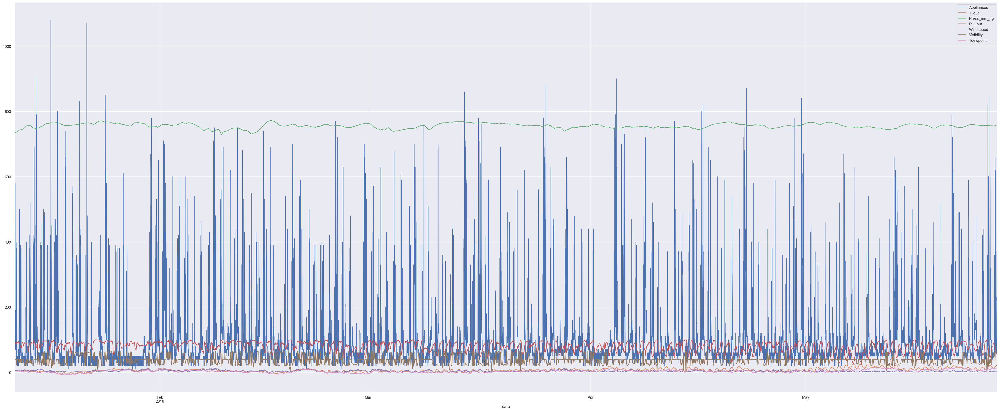

In [32]:
date_c.plot()

In [33]:
# Load the data
df = pd.read_csv('energydata_complete-1.csv', parse_dates=["date"])

# Set the date column as the index
df.set_index("date", inplace=True)
df=df.drop([ 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'rv1', 'rv2'],axis=1)

<AxesSubplot: xlabel='date'>

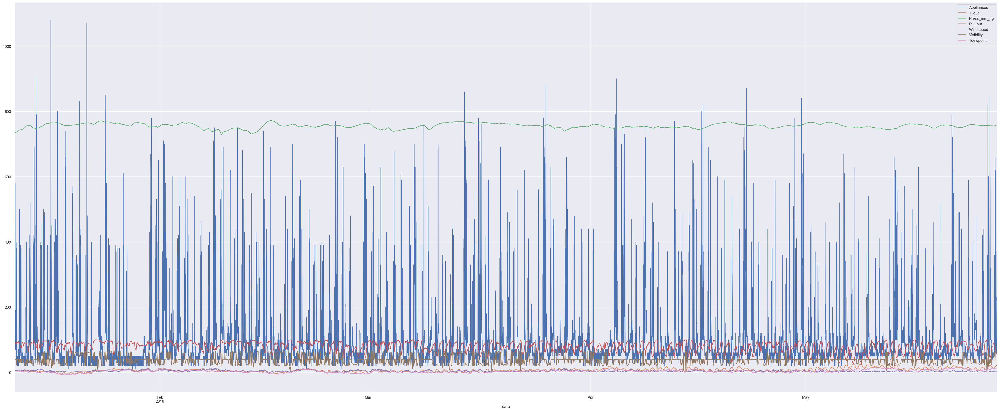

In [34]:
df.plot()

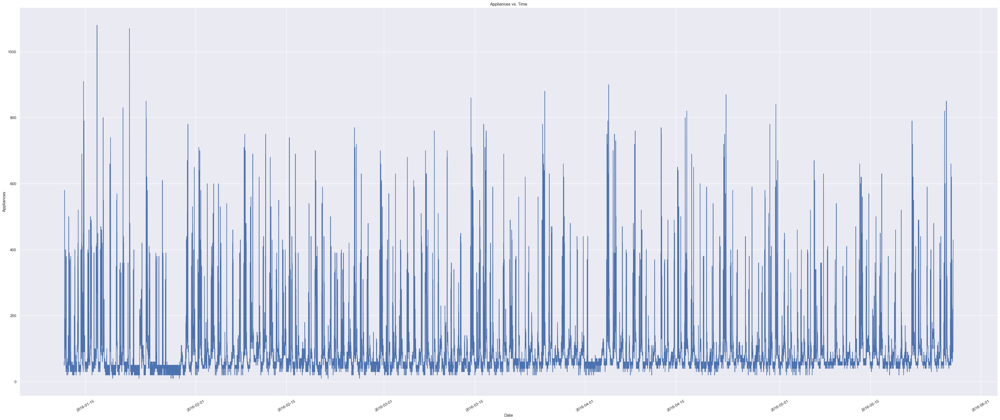

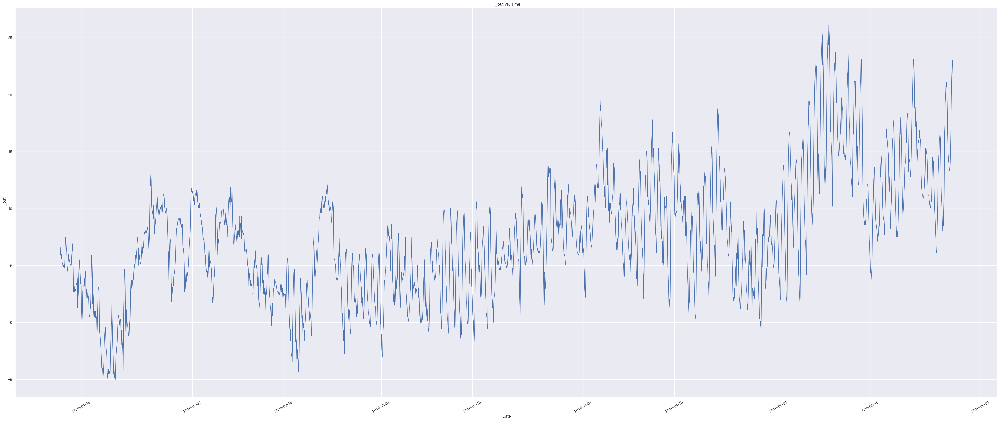

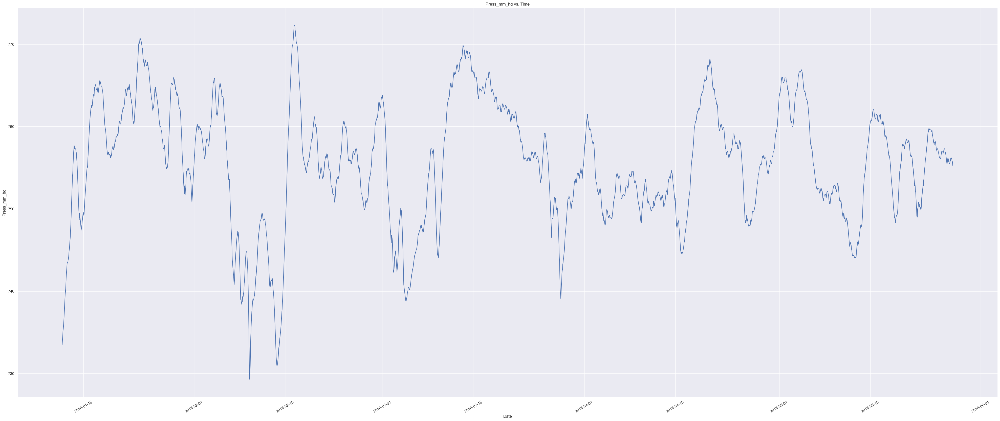

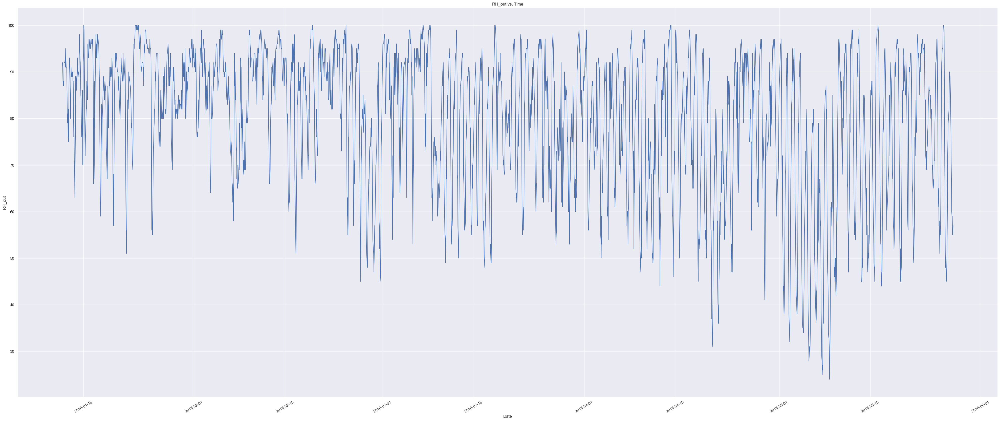

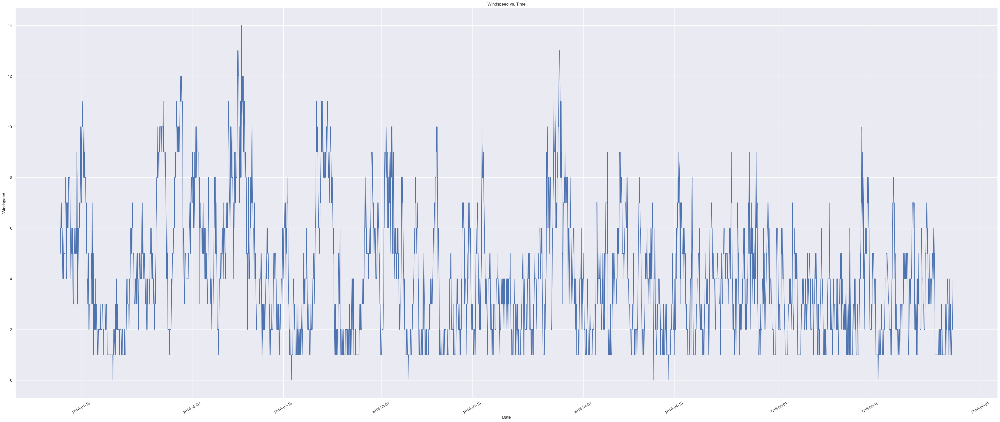

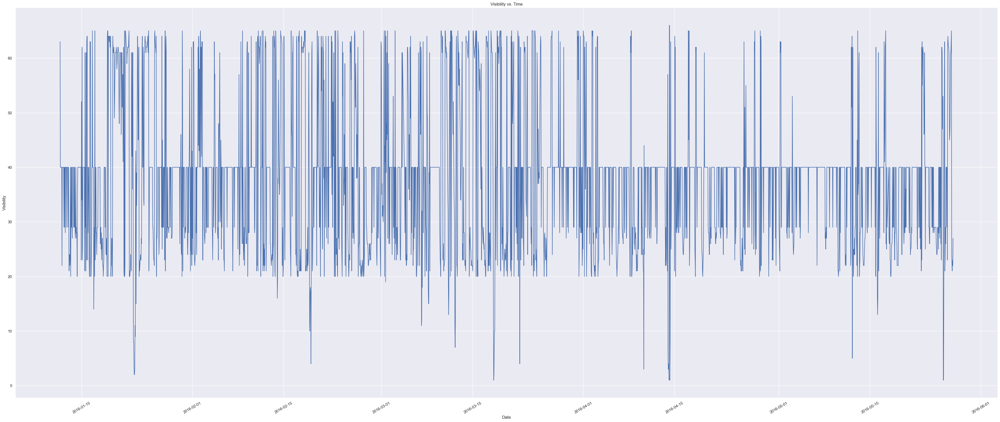

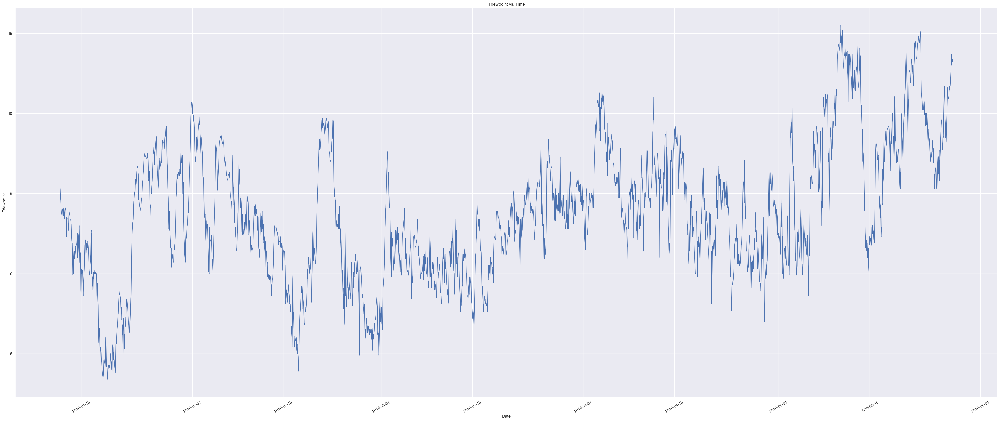

<Figure size 3000x1000 with 0 Axes>

In [35]:
# Select the columns to plot
columns_to_plot = ["Appliances", "T_out", "Press_mm_hg","RH_out","Windspeed","Visibility","Tdewpoint"]
# Plot each column individually against time
for col in columns_to_plot:
    plt.figure()
    plt.plot(df[col])
    plt.xlabel("Date")
    plt.ylabel(col)
    plt.title(f"{col} vs. Time")
    plt.xticks(rotation=30)
    
plt.figure(figsize=(30, 10))
plt.show()


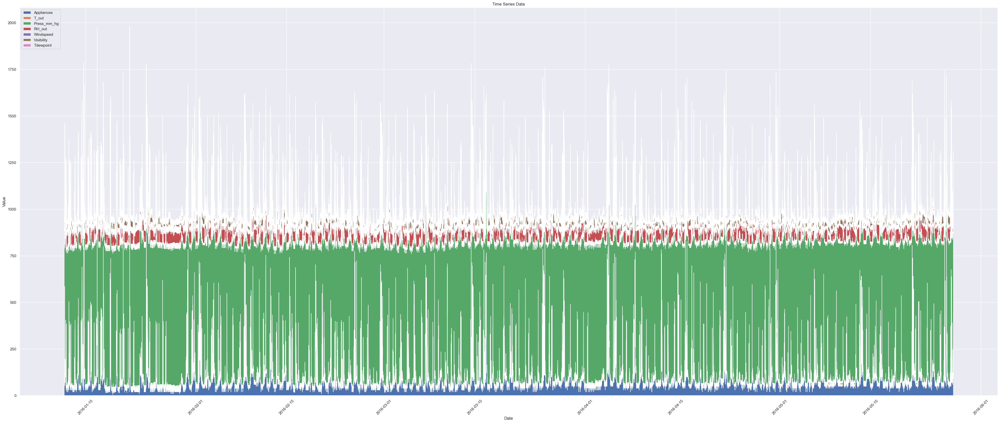

<Figure size 3000x2000 with 0 Axes>

In [36]:
# Create a stacked area chart for each column
plt.stackplot(df.index, *[df[col] for col in columns_to_plot], labels=columns_to_plot)
plt.xlabel("Date")
plt.ylabel("Value")
plt.title("Time Series Data")
plt.legend(loc="upper left")
plt.xticks(rotation=45)
plt.figure(figsize=(30, 20))
plt.show()

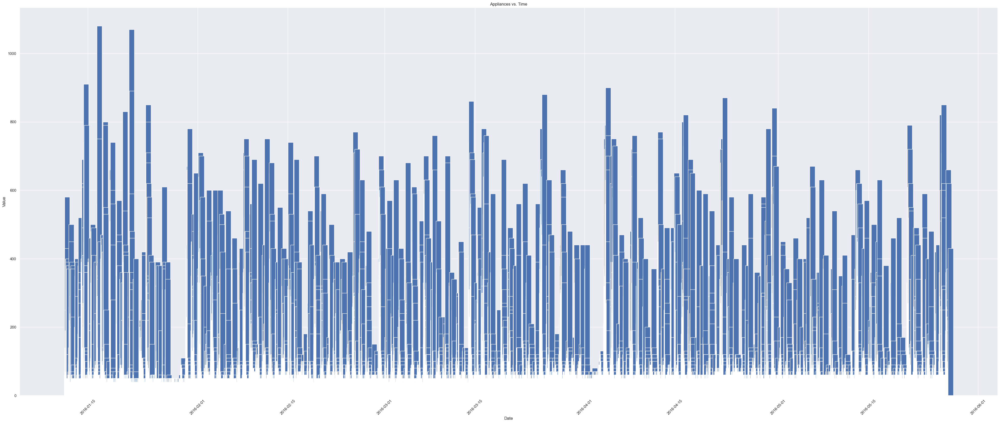

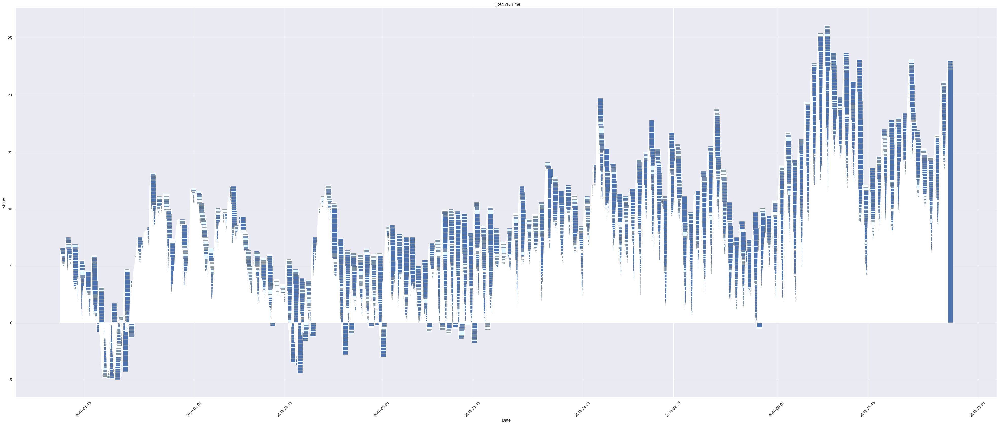

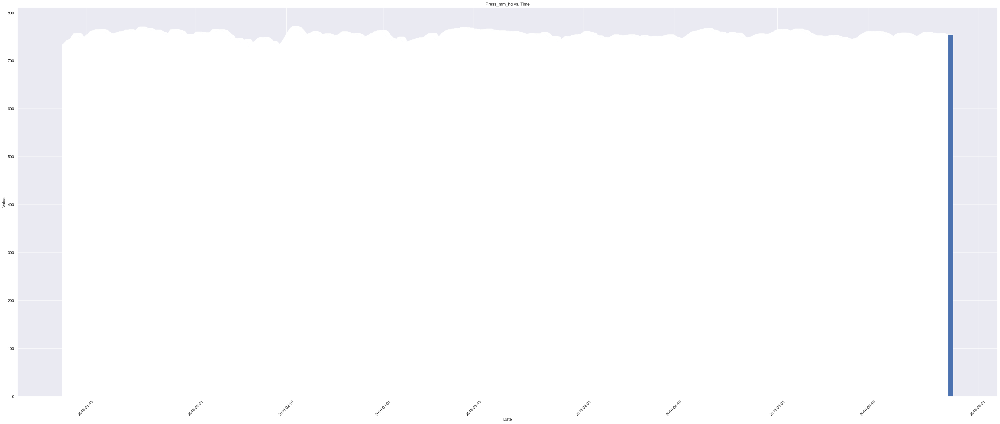

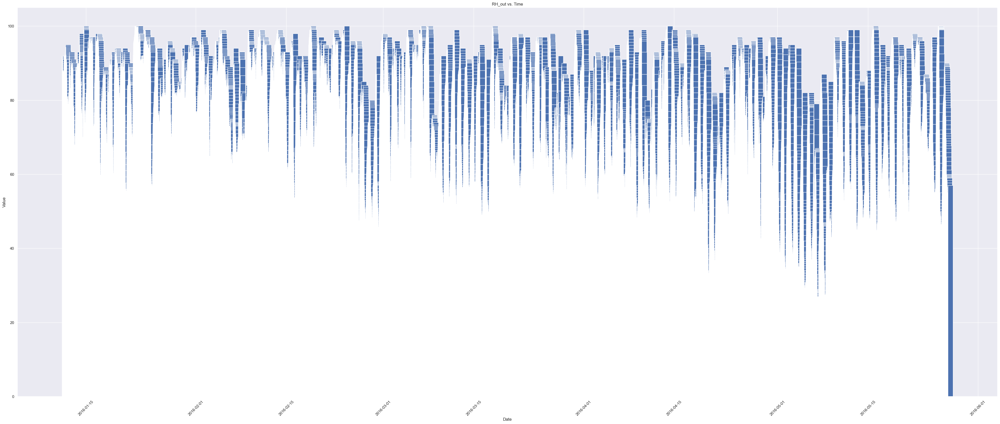

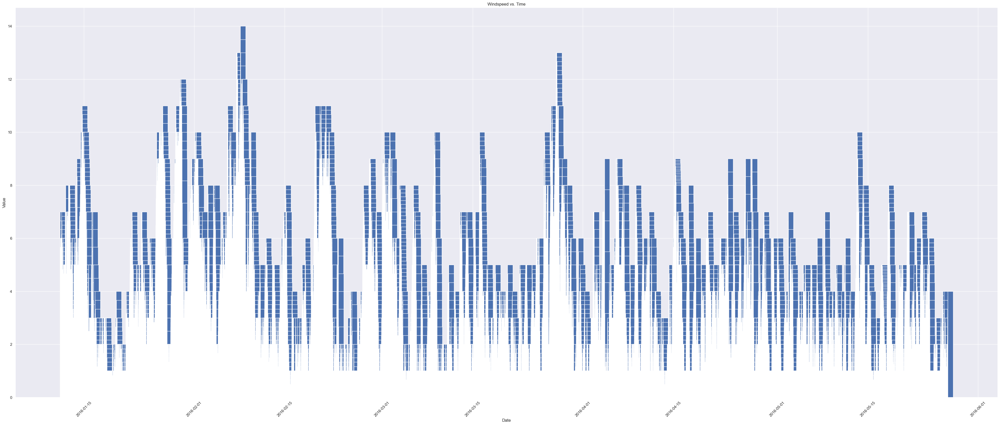

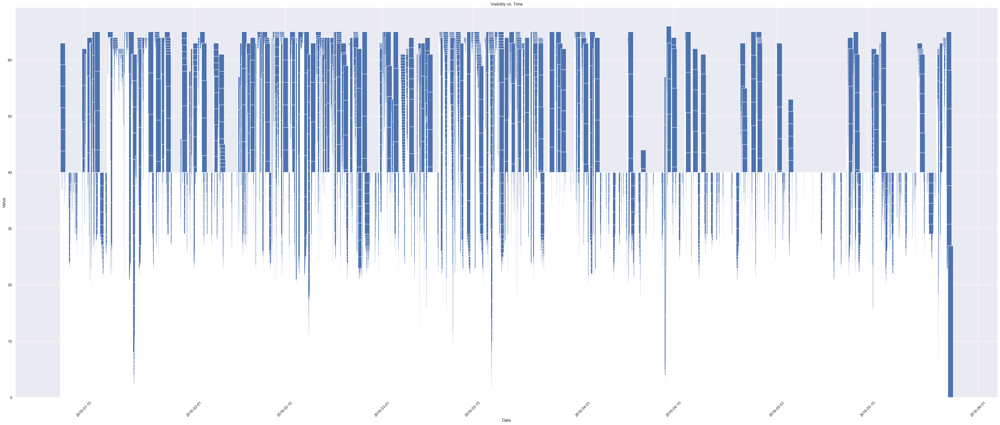

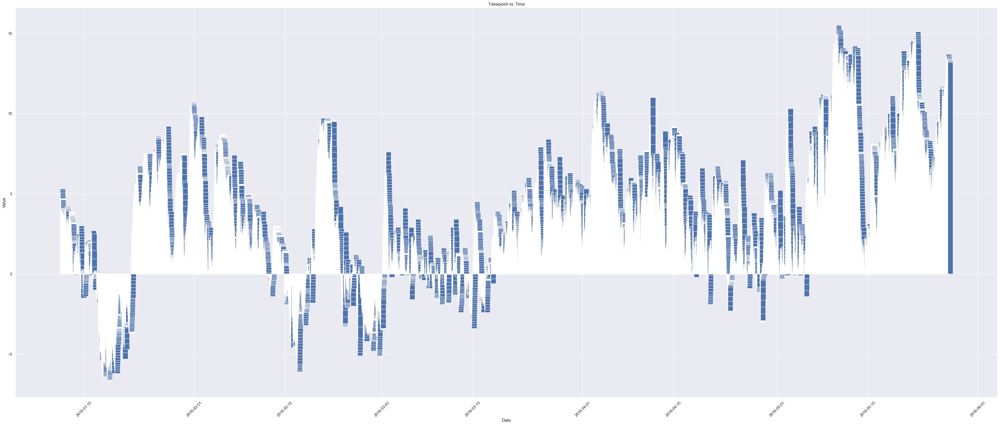

In [37]:
# Create a bar graph for each column
for col in columns_to_plot:
    plt.figure()
    plt.bar(df.index, df[col])
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.title(f"{col} vs. Time")
    plt.xticks(rotation=45)
plt.show()

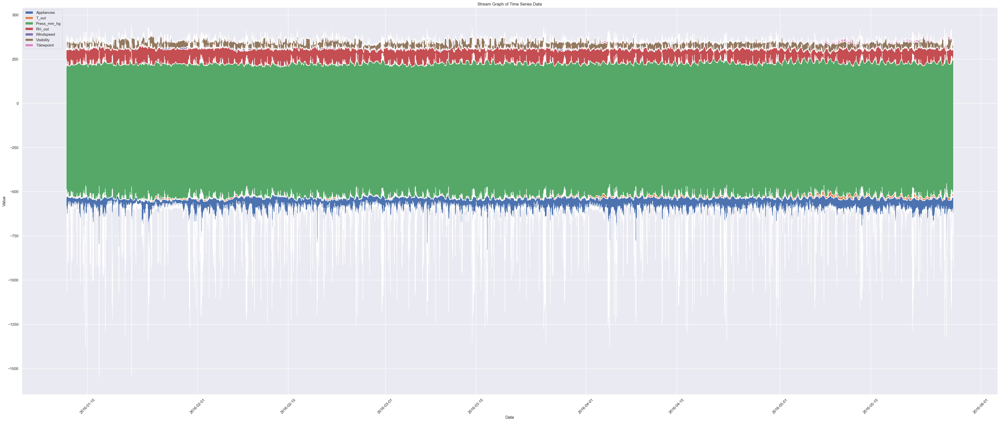

In [38]:
# Create a stream graph of the data
plt.figure()
plt.stackplot(df.index, df.transpose(), labels=df.columns, baseline='wiggle')
plt.xlabel("Date")
plt.ylabel("Value")
plt.title("Stream Graph of Time Series Data")
plt.legend(loc='upper left')
plt.xticks(rotation=45)
plt.show()

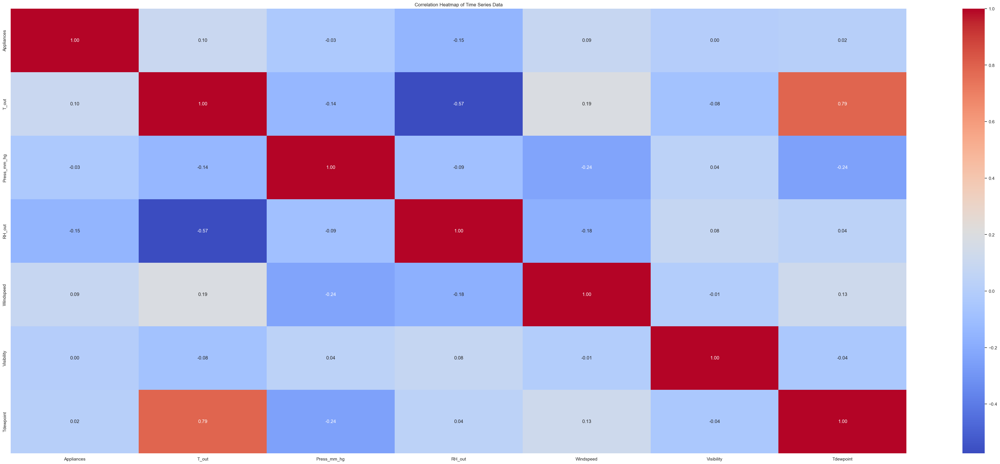

<Figure size 5000x5000 with 0 Axes>

In [39]:
# Create a heatmap of the data
plt.figure()
sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt=".2f")
plt.title("Correlation Heatmap of Time Series Data")
plt.figure(figsize=(50, 50))

plt.show()

### Implement and Train prediction models

In [40]:
value=pd.DataFrame(series_value)
#creating date series for with T and T+1 shifted features for time series forcasting
date_df=pd.concat([value,value.shift(1)],axis=1)
date_df.dropna(inplace=True)
#changing column names for easier execution
date_df.columns=['0(T)','1(T)','2(T)','3(T)','4(T)','5(T)','6(T)','0(T1)','1(T1)','2(T1)','3(T1)','4(T1)','5(T1)','6(T1)']
date_df.shape

(19734, 14)

In [41]:
# split into train and test sets
values = date_df.values


#Using min max scaler to transform values
scaler = MinMaxScaler()
scaledValues = scaler.fit_transform(values)

# split into test and train
n_train_hours = 6*24*60
train = scaledValues[:n_train_hours, :]
test = scaledValues[n_train_hours:, :]

# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

train_X_LSTM = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X_LSTM = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

# print shape
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8640, 13) (8640,) (11094, 13) (11094,)


### For Proper execution of models run all LSTM Cells Then Run XGBoost cells cause of model name is the same

Epoch 1/50
120/120 - 1s - loss: 0.1582 - val_loss: 0.1623 - 1s/epoch - 10ms/step
Epoch 2/50
120/120 - 0s - loss: 0.1059 - val_loss: 0.1191 - 202ms/epoch - 2ms/step
Epoch 3/50
120/120 - 0s - loss: 0.0846 - val_loss: 0.0968 - 205ms/epoch - 2ms/step
Epoch 4/50
120/120 - 0s - loss: 0.0638 - val_loss: 0.0691 - 206ms/epoch - 2ms/step
Epoch 5/50
120/120 - 0s - loss: 0.0452 - val_loss: 0.0344 - 198ms/epoch - 2ms/step
Epoch 6/50
120/120 - 0s - loss: 0.0334 - val_loss: 0.0421 - 199ms/epoch - 2ms/step
Epoch 7/50
120/120 - 0s - loss: 0.0213 - val_loss: 0.0405 - 197ms/epoch - 2ms/step
Epoch 8/50
120/120 - 0s - loss: 0.0158 - val_loss: 0.0271 - 202ms/epoch - 2ms/step
Epoch 9/50
120/120 - 0s - loss: 0.0111 - val_loss: 0.0124 - 203ms/epoch - 2ms/step
Epoch 10/50
120/120 - 0s - loss: 0.0106 - val_loss: 0.0163 - 200ms/epoch - 2ms/step
Epoch 11/50
120/120 - 0s - loss: 0.0119 - val_loss: 0.0130 - 197ms/epoch - 2ms/step
Epoch 12/50
120/120 - 0s - loss: 0.0113 - val_loss: 0.0226 - 197ms/epoch - 2ms/step
Epo

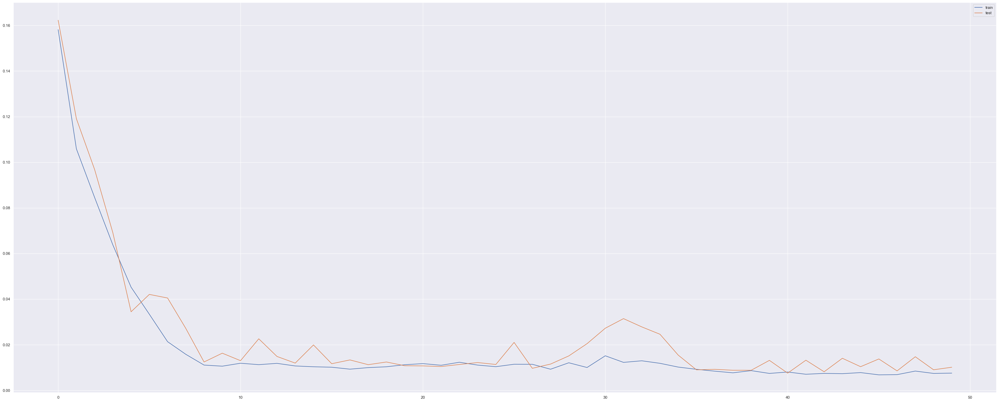

In [42]:
# LSTM(RNN) MODEL
#{2}-reference
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
model_LSTM = Sequential()
model_LSTM.add(LSTM(64, activation = 'relu', input_shape=(train_X_LSTM.shape[1], train_X_LSTM.shape[2])))
model_LSTM.add(Dense(1))
model_LSTM.compile(loss='mae', optimizer='adam')

history_LSTM = model_LSTM.fit(train_X_LSTM, train_y, epochs=50, batch_size=72, validation_data=(test_X_LSTM, test_y), verbose=2, shuffle=False)
# plot history
plt.plot(history_LSTM.history['loss'], label='train')
plt.plot(history_LSTM.history['val_loss'], label='test')
plt.legend()
plt.show()

In [44]:
yhat = model_LSTM.predict(test_X_LSTM)
test_X = test_X.reshape((test_X_LSTM.shape[0], test_X_LSTM.shape[2]))
# invert scaling for forecast
inv_yhat = np.concatenate((yhat, test_X[:, :]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = np.concatenate((test_y, test_X[:, :]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('LSTM RMSE: %.3f' % rmse)

347/347 [==============================] - 0s 575us/step
LSTM RMSE: 14.482


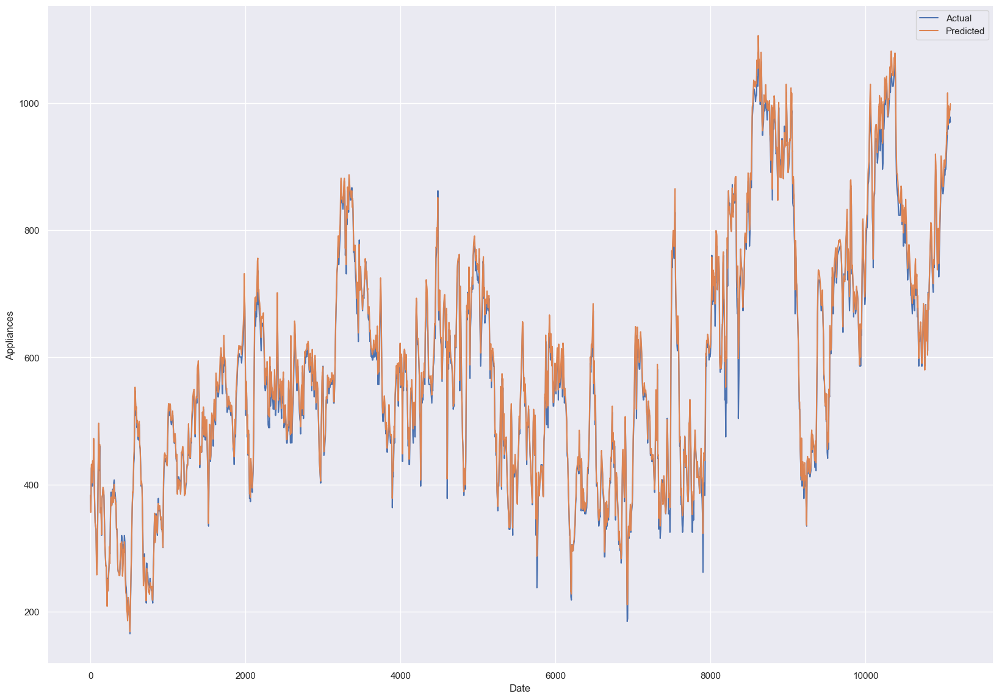

In [45]:
predDF = pd.DataFrame(inv_yhat, columns = ["prediction"])
realDF = pd.DataFrame(inv_y, columns = ["real"])

plt.figure(figsize =(20, 14))
plt.plot(pd.concat([realDF, predDF],axis=1))
plt.xlabel("Date")
plt.ylabel("Appliances")
plt.legend(["Actual", "Predicted"], loc ="upper right")

In [46]:
#XGBOOST MODEL
#{1}-reference
import xgboost
from xgboost import XGBRegressor
model_XG = XGBRegressor(objective='count:poisson',n_estimators=300, verbosity=3)
model_XG = XGBRegressor(objective='count:poisson',n_estimators=300, verbosity=3)
xgbmodel1 = model_XG.fit(train_X, train_y) 

[11:28:02] DEBUG: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/gbm/gbtree.cc:157: Using tree method: 2
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 72 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 68 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 68 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_pr

[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 52 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 50 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 84 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 80 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1

[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 20 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 22 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 66 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/tree/updater_prune.cc:98: tree pruning end, 32 extra nodes, 0 pruned nodes, max_depth=6
[11:28:02] INFO: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1

In [47]:
predictions_xgb = model_XG.predict(test_X)
rmse_xgb = sqrt(mean_squared_error(test_y, predictions_xgb))
print("XGBoost - Root Mean Square Error (RMSE): %.3f" % rmse_xgb)

XGBoost - Root Mean Square Error (RMSE): 0.037


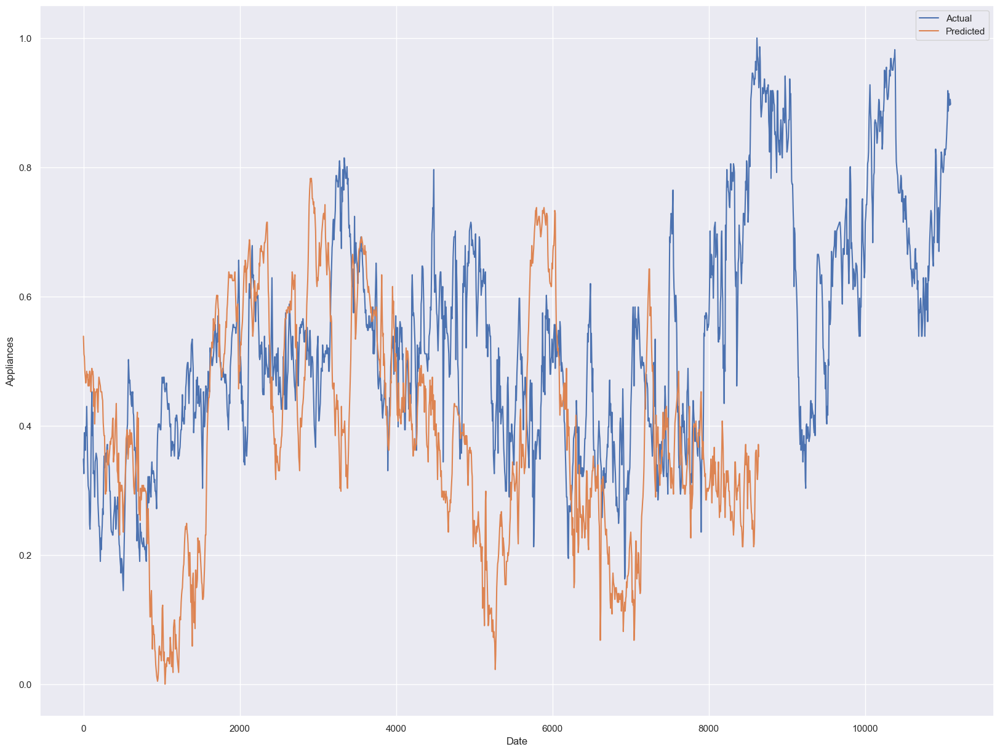

In [48]:
predictionDF = pd.DataFrame(train_y, columns = ["Prediction"])
actualDF = pd.DataFrame(test_y, columns = ["Real"])

plt.figure(figsize =(20, 15))
plt.plot(pd.concat([actualDF, predictionDF],axis=1))
plt.xlabel("Date")
plt.ylabel("Appliances")
plt.legend(["Actual", "Predicted"], loc ="upper right")

Root Mean Square Error (RMSE) for XGBoost : 0.037
XGBoost :when plotted against the real values gave a bad result as shown in the graphs above

Root Mean Square Error (RMSE) for LSTM : 12.406
LSTM :when plotted against the real values gave a extremely good result result as shown in the graphs above